<H1 style="color:navy;"><p style="font-family:Georgia;"><B><I><Center>Product Categorization in E-commerce Websites: A Machine Learning Approach Based on Availability Analysis</Center></I></B></p></H1>

 <h3 style="color:teal; font-family:Georgia;">Submitted By:</h3>
 <p style="font-family:Georgia;">Tanmayee Vilas Salunke</p>
 <p style="font-family:Georgia;">Masters in Data Science and Artificial Intelligence</p>
 <p style="font-family:Georgia;">January 2022 - May 2023</p>

<H3 style="color:teal;"><p style="font-family:Georgia;">Aim of the Artefact</H3>
<body>    
<p style="font-family:Georgia;">To create, construct, train, assess, and forecast the outcomes of product recommendation models using machine learning
</p>

<H3 style="color:teal;"><p style="font-family:Georgia;">Steps in implementation</H3>
<body>    
<ol style="font-family:Georgia;"><li>Importing Libraries</li>
<li>Importing Dataset</li>
<li>Exploratory Data Analysis</li>
<li>Data Augumentation</li>
<li>Data Preprocessing</li>
<li>Loading Data Features</li>
<li>Model Implemetation</li>
<li>Model Training</li>
<li>Data Augumentation Technique</li>
<li>Table for comparison of Metrics without Augumentation</li>
<li>able for comparison of Metrics with Augumentation</li>
<li>Determining Best Prediction Model</li>

<li> NER Implementation</li>
    </ol>

### 1. Importing Libraries

In [1]:
pip install -U imbalanced-learn > nul 2>&1

Note: you may need to restart the kernel to use updated packages.


In [2]:
# Data Analysis
import pandas as pd
import numpy as np

# Visualosaion
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px

# Pre-Processing Data
from sklearn import preprocessing

# Train Test Split
from sklearn.model_selection import train_test_split

# StandardScalar 
from sklearn.preprocessing import StandardScaler

# Models Implementation
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression

# SMOTE Analysis
from imblearn.over_sampling import SMOTE

# Implmentation of Decision Tree
from sklearn import tree

# Metrics
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import precision_recall_fscore_support
# from sklearn.metrics import classification_report

# For table of comparison
from tabulate import tabulate


# Natural Language Processing
import nltk

nltk.download('punkt', quiet=True)
nltk.download('averaged_perceptron_tagger', quiet=True)
nltk.download('maxent_ne_chunker', quiet=True)
nltk.download('words', quiet=True)

# Removing the Warnings
import warnings
warnings.filterwarnings('ignore')


### 2. Loading Dataset

In [3]:
data = pd.read_csv(r'C:\Users\s5431759\Downloads\flipkart_com-ecommerce_sample.csv')
data

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,c2d766ca982eca8304150849735ffef9,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",SRTEH2FF9KEDEFGF,999.0,379.0,"[""http://img5a.flixcart.com/image/short/u/4/a/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
1,7f7036a6d550aaa89d34c77bd39a5e48,2016-03-25 22:59:23 +0000,http://www.flipkart.com/fabhomedecor-fabric-do...,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",SBEEH3QGU7MFYJFY,32157.0,22646.0,"[""http://img6a.flixcart.com/image/sofa-bed/j/f...",False,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,No rating available,No rating available,FabHomeDecor,"{""product_specification""=>[{""key""=>""Installati..."
2,f449ec65dcbc041b6ae5e6a32717d01b,2016-03-25 22:59:23 +0000,http://www.flipkart.com/aw-bellies/p/itmeh4grg...,AW Bellies,"[""Footwear >> Women's Footwear >> Ballerinas >...",SHOEH4GRSUBJGZXE,999.0,499.0,"[""http://img5a.flixcart.com/image/shoe/7/z/z/r...",False,Key Features of AW Bellies Sandals Wedges Heel...,No rating available,No rating available,AW,"{""product_specification""=>[{""key""=>""Ideal For""..."
3,0973b37acd0c664e3de26e97e5571454,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",SRTEH2F6HUZMQ6SJ,699.0,267.0,"[""http://img5a.flixcart.com/image/short/6/2/h/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
4,bc940ea42ee6bef5ac7cea3fb5cfbee7,2016-03-25 22:59:23 +0000,http://www.flipkart.com/sicons-all-purpose-arn...,Sicons All Purpose Arnica Dog Shampoo,"[""Pet Supplies >> Grooming >> Skin & Coat Care...",PSOEH3ZYDMSYARJ5,220.0,210.0,"[""http://img5a.flixcart.com/image/pet-shampoo/...",False,Specifications of Sicons All Purpose Arnica Do...,No rating available,No rating available,Sicons,"{""product_specification""=>[{""key""=>""Pet Type"",..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19997,93e9d343837400ce0d7980874ece471c,2015-12-01 10:15:43 +0000,http://www.flipkart.com/elite-collection-mediu...,Elite Collection Medium Acrylic Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE7VAYDKQZEBSD,1299.0,999.0,"[""http://img5a.flixcart.com/image/sticker/b/s/...",False,Buy Elite Collection Medium Acrylic Sticker fo...,No rating available,No rating available,Elite Collection,"{""product_specification""=>[{""key""=>""Number of ..."
19998,669e79b8fa5d9ae020841c0c97d5e935,2015-12-01 10:15:43 +0000,http://www.flipkart.com/elite-collection-mediu...,Elite Collection Medium Acrylic Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE8YSVEPPCZ42Y,1499.0,1199.0,"[""http://img5a.flixcart.com/image/sticker/4/2/...",False,Buy Elite Collection Medium Acrylic Sticker fo...,No rating available,No rating available,Elite Collection,"{""product_specification""=>[{""key""=>""Number of ..."
19999,cb4fa87a874f715fff567f7b7b3be79c,2015-12-01 10:15:43 +0000,http://www.flipkart.com/elite-collection-mediu...,Elite Collection Medium Acrylic Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE88KN9ZDSGZKY,1499.0,999.0,"[""http://img6a.flixcart.com/image/sticker/z/k/...",False,Buy Elite Collection Medium Acrylic Sticker fo...,No rating available,No rating available,Elite Collection,"{""product_specification""=>[{""key""=>""Number of ..."
20000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
# Copying the data in d1 variable
d1 = data

In [5]:
# Finding null values
d1.isnull().sum();

In [6]:
# Dropping the null values
d1 = d1.dropna()
d1.isnull().sum()

uniq_id                    0
crawl_timestamp            0
product_url                0
product_name               0
product_category_tree      0
pid                        0
retail_price               0
discounted_price           0
image                      0
is_FK_Advantage_product    0
description                0
product_rating             0
overall_rating             0
brand                      0
product_specifications     0
dtype: int64

### 3.EDA

In [7]:
# Plotting the Ratings given to Product
fig = px.histogram(data_frame=d1, x='product_rating')
fig.update_layout(width=600,  height=600 )
fig.show()

In [8]:
# Plotting the Retail price and discounted price
fig=px.scatter(d1,x='retail_price', y='discounted_price')
fig.update_layout(width=600,  height=600 )
fig.show()

In [9]:
# Distribution of Brand by Discounted Price
fig = px.box(d1, x='brand', y='discounted_price')
fig.update_layout(
    title='Distribution of Brand by Discounted Price'
)
fig.update_xaxes(tickangle=45)
fig.update_layout(width=600,  height=600)
fig.show()

In [10]:
# Heatmap of Features
fig = px.imshow(d1.corr(), color_continuous_scale='RdBu_r')
fig.update_layout(title='Correlation Heatmap', xaxis_title='Features', yaxis_title='Features')
fig.update_xaxes(side='top')
fig.update_layout(width=600,  height=600 )
fig.show()

### 4. Generating Labels 

In [11]:
# Dropping the Nan values
df = d1.dropna()

### Description to generate_labels function
By dividing the "product_category_tree" column on ">>" and picking the first element, the function first adds a new column called "label" to the DataFrame df. It then deletes the first two letters as well as any preceding or trailing whitespace.

The top categories are then extracted, chosen based on the index, and stored in the top_categories variable using the value counts from the 'label' column.

The method then returns the DataFrame after filtering it to only maintain the rows where the 'label' field is present in the top_categories.

In [12]:
# Function to generate labels
def generate_label(df,top):
    df['label']=df['product_category_tree'].apply(lambda x: x.split('>>')[0][2:].strip())
    top_categories = df['label'].value_counts().nlargest(top).index
    df = df[df['label'].isin(top_categories)]
    return df

### Description to seperating labels block
The code first determines the number of distinct values in the 'product_category_tree' column of the DataFrame df and sets the top variable to the minimum of 90 and the number of distinct values.

The generated DataFrame is then saved in the variable d1 after being sent as parameters to the generate_label function with the arguments df and top.

The index that holds the distinct labels produced by the generate_label function is then chosen using the value counts of the 'label' column of d1. The generated_labels variable contains these labels.

The generated_labels variable is then printed to the terminal. The 'product_category_tree' column of the DataFrame df is simply used by this code to extract the top 90 categories, which then provides a list of unique labels for each of those top 90 categories.


In [13]:
# Seperating the labels
unique_labels = len(df['product_category_tree'].unique())
top = min(unique_labels,90)
d1 = generate_label(df,top)
generated_labels = d1['label'].value_counts().index
print(generated_labels)

Index(['Jewellery', 'Clothing', 'Mobiles & Accessories', 'Automotive',
       'Home Decor & Festive Needs', 'Home Furnishing', 'Computers',
       'Baby Care', 'Tools & Hardware', 'Footwear', 'Kitchen & Dining',
       'Furniture', 'Pens & Stationery', 'Beauty and Personal Care',
       'Bags, Wallets & Belts', 'Sports & Fitness', 'Toys & School Supplies',
       'Home Improvement', 'Cameras & Accessories', 'Watches',
       'Health & Personal Care Appliances', 'Sunglasses', 'Gaming',
       'Pet Supplies', 'Home & Kitchen', 'Home Entertainment', 'Eyewear',
       'Clovia Women's Full Coverage Bra"]',
       'Vishudh Printed Women's Straight Kurta"]',
       'Lilliput Top Baby Girl's  Combo"]', 'Olvin Aviator Sunglasses"]',
       'Clovia Women's T-Shirt Bra"]', 'MASARA Solid Women's Straight Kurta"]',
       'Pu-Good Women Flats"]',
       'Firangi Cotton, Polyester Free Floor Mat Firangi..."]',
       'Olvin Wayfarer Sunglasses"]', 'Dressberry Gold Synthetic  Clutch"]',
       'House

In [14]:
# Counting the number of values for each label
label_counts = d1['label'].value_counts()
print(label_counts)

Jewellery                                                3521
Clothing                                                 3129
Mobiles & Accessories                                    1096
Automotive                                               1010
Home Decor & Festive Needs                                859
                                                         ... 
Amita Home Furnishing Cotton Floral Single Bedsh..."]       1
Linzina Fashions LIN-HOSS-1.5 Faucet Set"]                  1
Legmark Slim Fit Women's Blue Jeans"]                       1
Dolz Slim Fit Fit Women's Brown Jeans"]                     1
Sj Bushnell 119M / 1000 Binoculars (36 mm, Black)"]         1
Name: label, Length: 90, dtype: int64


With the help of below code, the DataFrame d1 is filtered to only retain the rows for which the label_counts index contains a value for the 'label' column with a count more than or equal to min_count.

The pandas Series label_counts is supposed to hold the value counts of the 'label' column. Only the labels with counts higher than or equal to the minimum count are chosen by label_counts[label_counts>=min_count], and the matching index values are chosen by.index.

As a result, the code eliminates any labels from the 'label' column of d1 that occur less than min_count times. In the generated DataFrame, d1, only the rows with the label at least min_count times are present.


In [15]:
# Seperating the label with values more than 20
min_count = 20
d1 =d1[d1['label'].isin(label_counts[label_counts>=min_count].index)]
print(d1)

                                uniq_id            crawl_timestamp  \
0      c2d766ca982eca8304150849735ffef9  2016-03-25 22:59:23 +0000   
1      7f7036a6d550aaa89d34c77bd39a5e48  2016-03-25 22:59:23 +0000   
2      f449ec65dcbc041b6ae5e6a32717d01b  2016-03-25 22:59:23 +0000   
3      0973b37acd0c664e3de26e97e5571454  2016-03-25 22:59:23 +0000   
4      bc940ea42ee6bef5ac7cea3fb5cfbee7  2016-03-25 22:59:23 +0000   
...                                 ...                        ...   
19995  7179d2f6c4ad50a17d014ca1d2815156  2015-12-01 10:15:43 +0000   
19996  71ac419198359d37b8fe5e3fffdfee09  2015-12-01 10:15:43 +0000   
19997  93e9d343837400ce0d7980874ece471c  2015-12-01 10:15:43 +0000   
19998  669e79b8fa5d9ae020841c0c97d5e935  2015-12-01 10:15:43 +0000   
19999  cb4fa87a874f715fff567f7b7b3be79c  2015-12-01 10:15:43 +0000   

                                             product_url  \
0      http://www.flipkart.com/alisha-solid-women-s-c...   
1      http://www.flipkart.com/fabhomed

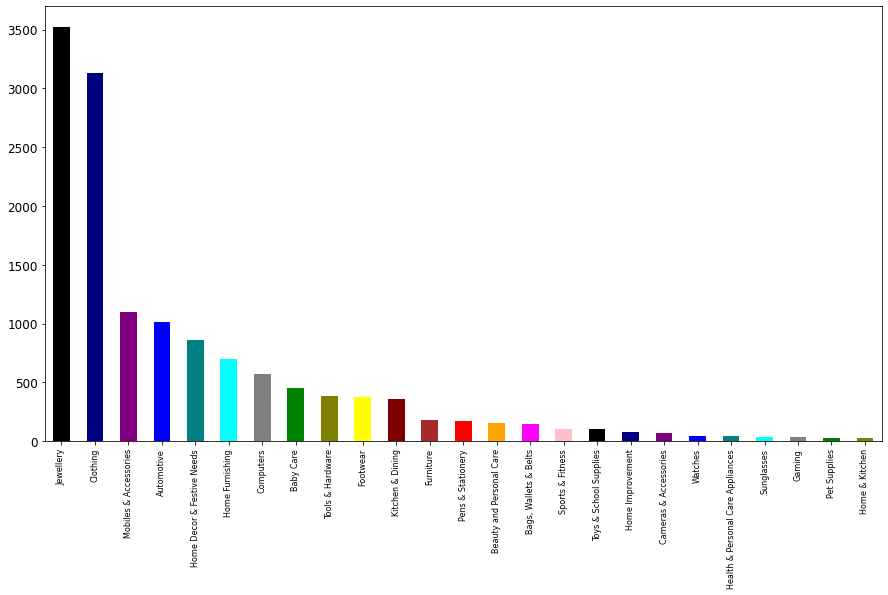

In [16]:
# Plotting the values of Labels
colors = ['black','navy','purple','blue','teal','cyan','gray','green','olive','yellow','maroon','brown','red','orange','magenta','pink']
plt.figure(figsize=(15,8))
d1['label'].value_counts().sort_values(ascending=False).plot(kind='bar',color=colors)
plt.yticks(fontsize=12)
plt.xticks(fontsize=8, rotation=90)
plt.show()

### Description of recommend_products_by_label function
The function initially restricts the products in the DataFrame to those with the provided label. It generates a fresh DataFrame called filtered_df with just the rows with label in the 'label' column.

The best 5 goods from filtered_df are then suggested based on customer reviews. It uses the 'product_rating' column to organise the filtered_df DataFrame in decreasing order, then uses.head(5) to choose the first 5 rows, storing the resultant DataFrame in top_5_products.

The 'product_name' column of the top_5_products is then selected, turned into a list using list(), and returned from the function to generate a list of the names of the suggested products.


In [17]:
# Function to Recommend the products
def recommend_products_by_label(df, label):
    # Filter the dataframe to include only the products with the specified label
    filtered_df = df[df['label'] == label]
    
    # Recommend the top 5 products based on their rating
    top_5_products = filtered_df.sort_values('product_rating', ascending=False).head(5)
    recommended_products = list(top_5_products['product_name'])
    
    return recommended_products

### Explanation to check_recommendations function
The function initially restricts the products in the DataFrame to those with the provided label. It generates a fresh DataFrame called filtered_df with just the rows with label in the 'label' column.

The products stored in filtered_df are then sorted by customer rating in descending order, and the resultant DataFrame is kept in sorted_products.

Finally, it verifies that all of the suggested products are among the top 5 sellers for the given label. To achieve this, it chooses the 'product_name' column from the first five rows of sorted_products, turns it into a list using list(), and then uses the all() method to see if the recommended_products products are all included in this list. It returns True if all suggested products are among the top 5 rated items and False otherwise.

In [18]:
# Function to check recommendations
def check_recommendations(df, label, recommended_products):
    # Filter the dataframe to include only the products with the specified label
    filtered_df = df[df['label'] == label]
    
    # Sort the products by their rating
    sorted_products = filtered_df.sort_values('product_rating', ascending=False)
    
    # Check if the recommended products are in the top 5 rated products for the label
    is_correct = all(product in list(sorted_products['product_name'][:5]) for product in recommended_products)
    
    return is_correct

### Explanation to generation of labels
Using the input() method, the code asks the user to submit a label for which product recommendations are required. The user's input is then saved in the label variable.

It then uses the DataFrame d1 and the label input to call the recommend_products_by_label() function to obtain a list of suggested products for the given label, which it then saves in the recommended_products variable.

Finally, a for loop and the enumerate() function are used to output the top 5 prodcuts that are suggested for the given label. Using the print() method, it iterates through the recommended_products list and outputs the product names along with their rankings (beginning at 1).

In [19]:
# Take the label and generate the results
label = input("Enter a label to recommend products for: ")
recommended_products = recommend_products_by_label(d1, label)
print(f"Top 5 recommended products for {label}:")
for i, product in enumerate(recommended_products):
    print(f"{i+1}. {product}")

Enter a label to recommend products for: 
Top 5 recommended products for :


### Checking the generated labels
The below block of code checks if the generated labels are correct or not. If the generateg label in present in the label list then the statement is printed that the "The recommended products are correct." else "The recommended products are incorrect"

In [20]:
# Check if the generated label is correct or wrong
is_correct = check_recommendations(d1, label, recommended_products)
if is_correct:
    print("The recommended products are correct!")
else:
    print("The recommended products are incorrect!")

The recommended products are correct!


### Data Preprocessing

In [21]:
# Columns of the dataset
data.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications'],
      dtype='object')

In [22]:
# Counting the Data elements
data.count()

uniq_id                    20000
crawl_timestamp            20000
product_url                20000
product_name               20000
product_category_tree      20000
pid                        20000
retail_price               19922
discounted_price           19922
image                      19997
is_FK_Advantage_product    20000
description                19998
product_rating             20000
overall_rating             20000
brand                      14136
product_specifications     19986
dtype: int64

In [23]:
# Checking for nunll values
data.isnull().sum();

In [24]:
# Dropping the null values
data = data.dropna()

In [25]:
# Checking null values
data.isnull().sum();

In [26]:
# Copying the value into d variable
d = data

### String to Categorical

The code encodes each column of the dataframe as categorical variables using the pd.Categorical(col).codes method, which assigns a unique integer code to each unique value in the column. This allows for the data to be analyzed using machine learning algorithms that require numerical input.

In [27]:
d[['uniq_id']]=d[['uniq_id']].apply(lambda col:pd.Categorical(col).codes)
d[['is_FK_Advantage_product']]=d[['is_FK_Advantage_product']].apply(lambda col:pd.Categorical(col).codes)
d[['crawl_timestamp']]=d[['crawl_timestamp']].apply(lambda col:pd.Categorical(col).codes)
d[['product_url']]=d[['product_url']].apply(lambda col:pd.Categorical(col).codes)
d[['product_name']]=d[['product_name']].apply(lambda col:pd.Categorical(col).codes)
d[['product_category_tree']]=d[['product_category_tree']].apply(lambda col:pd.Categorical(col).codes)
d[['pid']]=d[['pid']].apply(lambda col:pd.Categorical(col).codes)
d[['image']]=d[['image']].apply(lambda col:pd.Categorical(col).codes)
d[['description']]=d[['description']].apply(lambda col:pd.Categorical(col).codes)
d[['product_rating']]=d[['product_rating']].apply(lambda col:pd.Categorical(col).codes)
d[['overall_rating']]=d[['overall_rating']].apply(lambda col:pd.Categorical(col).codes)
d[['brand']]=d[['brand']].apply(lambda col:pd.Categorical(col).codes)
d[['product_specifications']]=d[['product_specifications']].apply(lambda col:pd.Categorical(col).codes)

In [28]:
d

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,10744,120,515,508,1676,12583,999.0,379.0,5382,0,5167,35,35,162,9380
1,7056,120,3861,2669,2597,10609,32157.0,22646.0,12043,0,3438,35,35,914,8433
2,13437,120,1522,223,2470,11353,999.0,499.0,5265,0,5027,35,35,69,8150
3,515,120,513,508,1676,12581,699.0,267.0,5364,0,5164,35,35,162,9344
4,10398,120,10852,6874,4333,9298,220.0,210.0,3969,0,10677,35,35,2651,11313
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,6268,1,13496,8304,338,12710,1500.0,730.0,12732,0,2728,35,35,3189,9434
19996,6281,1,13572,8315,339,12804,1429.0,1143.0,12218,0,2751,35,35,3190,9236
19997,8164,1,3496,2494,334,12734,1299.0,999.0,5755,0,1466,35,35,838,9297
19998,5717,1,3510,2494,334,12750,1499.0,1199.0,5739,0,1462,35,35,838,9294


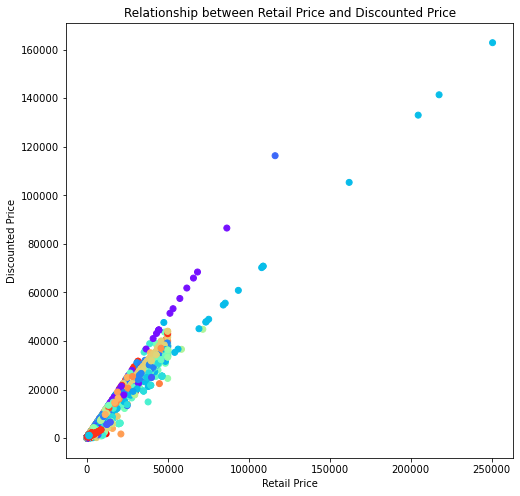

In [29]:
# Relationship between Retail Price and Discounted Price
plt.figure(figsize=(8,8))
plt.scatter(d['retail_price'],d['discounted_price'], c=d['product_name'], cmap='rainbow')
plt.xlabel('Retail Price')
plt.ylabel('Discounted Price')
plt.title('Relationship between Retail Price and Discounted Price')
plt.show()

<AxesSubplot:xlabel='brand', ylabel='overall_rating'>

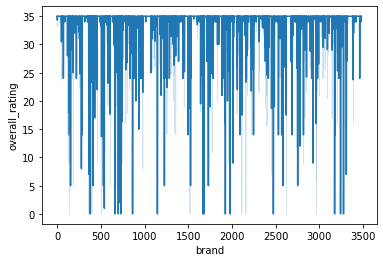

In [30]:
# Plotting Brand and Overall rating
sns.lineplot(d['brand'], d['overall_rating'])

In [31]:
# Distribution of Ratings by Product Specification
fig.update_layout(width=600,  height=400)
fig = px.violin(d, x='product_specifications', y='overall_rating', color='overall_rating',
                box=True, points="all", hover_data=d.columns)

fig.update_layout(
    title='Distribution of Ratings by Product Specification',
    xaxis_title='Product Specification',
    yaxis_title='Overall Rating'
)

fig.show()

### Loading Data Features

In [32]:
# Dividing the data into x and y for train and test
x=d.drop(['is_FK_Advantage_product'], axis=1)
y=d[['is_FK_Advantage_product']]

In [33]:
# Splitting into train and test in the ratio of 75:25
x_train, x_test, y_train, y_test = train_test_split(
             x, y, test_size = 0.25, random_state=42)

### Model Implementation

### 1)Random Forest

In [34]:
rf = RandomForestClassifier(n_estimators = 40) 
rf.fit(x_train, y_train)
y_pred1 =rf.predict(x_test)
accuracy_score(y_pred1, y_test)

0.9826458036984352

In [35]:
# Printing the Classification report
print(classification_report(y_pred1, y_test))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99      3485
           1       0.30      0.80      0.44        30

    accuracy                           0.98      3515
   macro avg       0.65      0.89      0.72      3515
weighted avg       0.99      0.98      0.99      3515



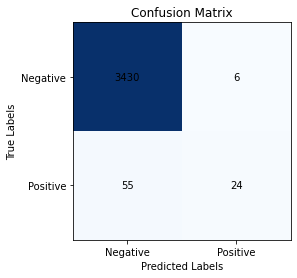

In [36]:
# Plotting the confusion matrix
confusion_matrix(y_test, y_pred1)
# y_test and y_pred1 are the actual and predicted labels, respectively
cm = confusion_matrix(y_test, y_pred1)

# plot the confusion matrix
plt.imshow(cm, cmap=plt.cm.Blues)

# set the plot labels
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.xticks([0, 1], ['Negative', 'Positive'])
plt.yticks([0, 1], ['Negative', 'Positive'])

# annotate the plot with the confusion matrix values
for i in range(2):
    for j in range(2):
        plt.text(j, i, cm[i, j], ha='center', va='center', color='black')

plt.show()

### Logistic Regression

In [37]:
lrc = LogisticRegression(random_state = 0)
lrc.fit(x_train, y_train)
y_pred2 = lrc.predict(x_test)
accuracy_score(y_pred2, y_test)

0.977524893314367

In [38]:
# Printing the classification report
print(classification_report(y_pred2, y_test))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99      3515
           1       0.00      0.00      0.00         0

    accuracy                           0.98      3515
   macro avg       0.50      0.49      0.49      3515
weighted avg       1.00      0.98      0.99      3515



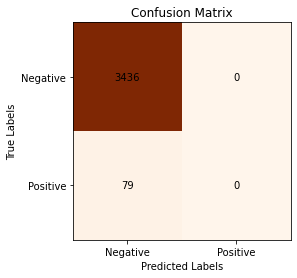

In [39]:
# Plotting Confusion Matrix
confusion_matrix(y_test, y_pred2)
# y_test and y_pred1 are the actual and predicted labels, respectively
cm = confusion_matrix(y_test, y_pred2)

# plot the confusion matrix
plt.imshow(cm, cmap=plt.cm.Oranges)

# set the plot labels
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.xticks([0, 1], ['Negative', 'Positive'])
plt.yticks([0, 1], ['Negative', 'Positive'])

# annotate the plot with the confusion matrix values
for i in range(2):
    for j in range(2):
        plt.text(j, i, cm[i, j], ha='center', va='center', color='black')

plt.show()

### Decision Tree Implementation

In [40]:
dt = DecisionTreeClassifier()
dt.fit(x_train, y_train)
y_pred3 = dt.predict(x_test)
accuracy_score(y_pred3, y_test)

0.9743954480796586

In [41]:
print(classification_report(y_pred3, y_test))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      3426
           1       0.49      0.44      0.46        89

    accuracy                           0.97      3515
   macro avg       0.74      0.71      0.73      3515
weighted avg       0.97      0.97      0.97      3515



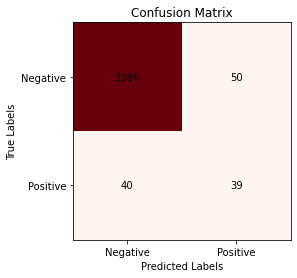

In [42]:
# y_test and y_pred1 are the actual and predicted labels, respectively
cm = confusion_matrix(y_test, y_pred3)

# plot the confusion matrix
plt.imshow(cm, cmap=plt.cm.Reds)

# set the plot labels
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.xticks([0, 1], ['Negative', 'Positive'])
plt.yticks([0, 1], ['Negative', 'Positive'])

# annotate the plot with the confusion matrix values
for i in range(2):
    for j in range(2):
        plt.text(j, i, cm[i, j], ha='center', va='center', color='black')

plt.show()

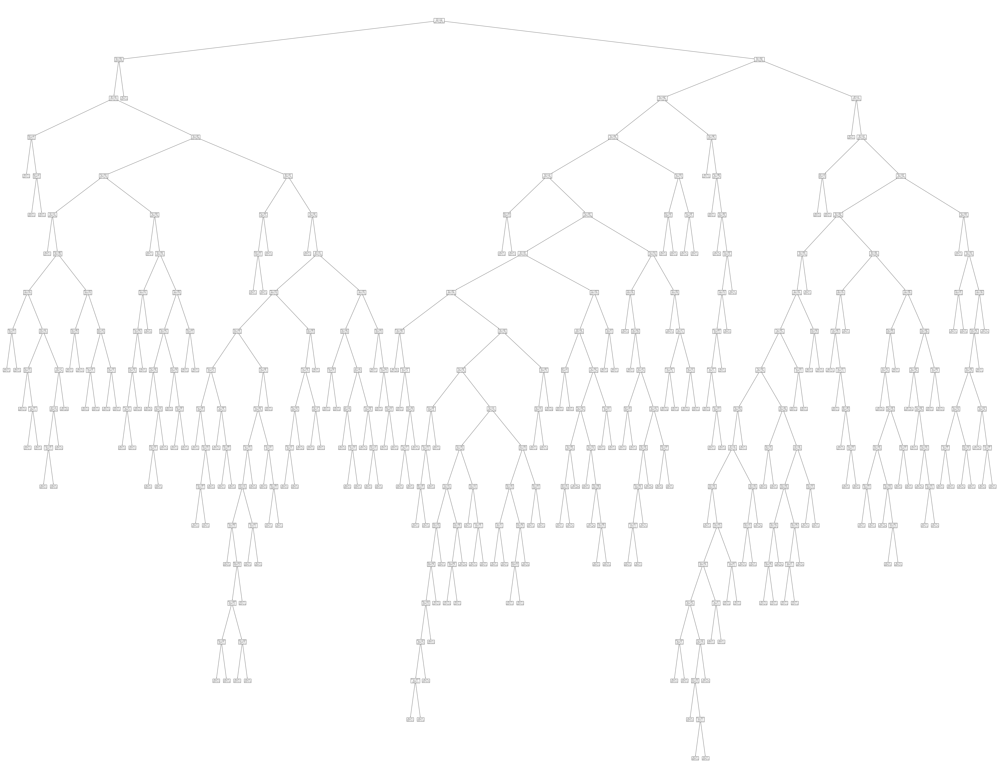

In [43]:
#tree.plot_tree(dt)
fig, ax = plt.subplots(figsize=(100, 80))
tree.plot_tree(dt, ax=ax)
plt.show()

### Data Augumentation Technique

### SMOTE Analysis

### Logistic Regression

In [44]:
sm = SMOTE(random_state=2)
X_train_res, y_train_res = sm.fit_resample(x_train, y_train['is_FK_Advantage_product'])
lr1 = LogisticRegression()
lr1.fit(X_train_res, y_train_res)
y_pred4 = lr1.predict(x_test)

print(classification_report(y_test, y_pred4))

              precision    recall  f1-score   support

           0       0.99      0.64      0.78      3436
           1       0.04      0.62      0.07        79

    accuracy                           0.64      3515
   macro avg       0.51      0.63      0.42      3515
weighted avg       0.97      0.64      0.76      3515



### Decision Tree

In [45]:
dt1 = DecisionTreeClassifier()
dt1.fit(X_train_res, y_train_res)
y_pred5 = dt1.predict(x_test)
  
print(classification_report(y_test, y_pred5))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98      3436
           1       0.27      0.47      0.34        79

    accuracy                           0.96      3515
   macro avg       0.63      0.72      0.66      3515
weighted avg       0.97      0.96      0.96      3515



### Random Forest

In [46]:
rf1 = RandomForestClassifier() 
rf1.fit(X_train_res, y_train_res)
y_pred6 = rf1.predict(x_test)
  
print(classification_report(y_test, y_pred6))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99      3436
           1       0.43      0.54      0.48        79

    accuracy                           0.97      3515
   macro avg       0.71      0.76      0.73      3515
weighted avg       0.98      0.97      0.98      3515



### Table for comparison of Metrics without Augumentation

In [59]:
from tabulate import tabulate

model_names = ['Logistic Regression', 'Random Forest', 'Decision Tree']
report1 = classification_report(y_pred1, y_test, output_dict=True)
report2 = classification_report(y_pred2, y_test, output_dict=True)
report3 = classification_report(y_pred3, y_test, output_dict=True)

headers = ["Model", "precision", "recall", "f1-score", "support"]
table1 = [[k] + list(v.values()) for k, v in report1.items() if k in ('0', '1')]
table2 = [[k] + list(v.values()) for k, v in report2.items() if k in ('0', '1')]
table3 = [[k] + list(v.values()) for k, v in report3.items() if k in ('0', '1')]

table1.insert(0, [model_names[0], '', '', '', ''])
table2.insert(0, [model_names[1], '', '', '', ''])
table3.insert(0, [model_names[2], '', '', '', ''])

print(tabulate(table1, headers=headers, tablefmt="grid", floatfmt=".2f"))
print(tabulate(table2, headers=headers, tablefmt="grid", floatfmt=".2f"))
print(tabulate(table3, headers=headers, tablefmt="grid", floatfmt=".2f"))


+---------------------+--------------------+--------------------+--------------------+-----------+
| Model               | precision          | recall             | f1-score           | support   |
+=====================+====================+====================+====================+===========+
| Logistic Regression |                    |                    |                    |           |
+---------------------+--------------------+--------------------+--------------------+-----------+
| 0                   | 0.9982537834691502 | 0.9842180774748924 | 0.9911862447623176 | 3485      |
+---------------------+--------------------+--------------------+--------------------+-----------+
| 1                   | 0.3037974683544304 | 0.8                | 0.4403669724770642 | 30        |
+---------------------+--------------------+--------------------+--------------------+-----------+
+---------------+-------------+-------------------+--------------------+-----------+
| Model         | precis

### Results after Augumentation

In [49]:
model_names = ['SMOTE Logistic Regression', 'SMOTE Random Forest', 'SMOTE Decision Tree']
report4 = classification_report(y_pred4, y_test, output_dict=True)
report5 = classification_report(y_pred5, y_test, output_dict=True)
report6 = classification_report(y_pred6, y_test, output_dict=True)

headers = ["Model", "precision", "recall", "f1-score", "support"]
table4 = [[k] + list(v.values()) for k, v in report4.items() if k in ('0', '1')]
table5 = [[k] + list(v.values()) for k, v in report5.items() if k in ('0', '1')]
table6 = [[k] + list(v.values()) for k, v in report6.items() if k in ('0', '1')]

table4.insert(0, [model_names[0], '', '', '', ''])
table5.insert(0, [model_names[1], '', '', '', ''])
table6.insert(0, [model_names[2], '', '', '', ''])

print(tabulate(table4, headers=headers, tablefmt="grid", floatfmt=".3f"))
print(tabulate(table5, headers=headers, tablefmt="grid", floatfmt=".4f"))
print(tabulate(table6, headers=headers, tablefmt="grid", floatfmt=".4f"))

+---------------------------+--------------------+---------------------+---------------------+-----------+
| Model                     | precision          | recall              | f1-score            | support   |
+===========================+====================+=====================+=====================+===========+
| SMOTE Logistic Regression |                    |                     |                     |           |
+---------------------------+--------------------+---------------------+---------------------+-----------+
| 0                         | 0.6391152502910361 | 0.9865229110512129  | 0.7756976333451078  | 2226      |
+---------------------------+--------------------+---------------------+---------------------+-----------+
| 1                         | 0.620253164556962  | 0.03801396431342126 | 0.07163742690058479 | 1289      |
+---------------------------+--------------------+---------------------+---------------------+-----------+
+---------------------+--------------

# Determining Best Prediction Model

In [49]:
mod1 = accuracy_score(y_pred1, y_test)
mod2 = accuracy_score(y_pred2, y_test)
mod3 = accuracy_score(y_pred3, y_test)
mod4 = accuracy_score(y_pred4, y_test)
mod5 = accuracy_score(y_pred5, y_test)
mod6 = accuracy_score(y_pred6, y_test)

In [50]:
d2 = {
    'Model Name': ['Random Forest', 'Logistic Regression', 
                   'Decision Tree', 'SMOTE_LR', 
                   'SMOTE_DT', 'SMOTE_RF'],
        'Accuracy Scores': [mod1, mod2, mod3, 
                            mod4, mod5, mod6]
}

In [51]:
Prediction_Models = pd.DataFrame(d2)
Prediction_Models

,Model Name,Accuracy Scores
0,Random Forest,0.984068
1,Logistic Regression,0.977525
2,Decision Tree,0.976102
3,SMOTE_LR,0.638407
4,SMOTE_DT,0.961878
5,SMOTE_RF,0.970413


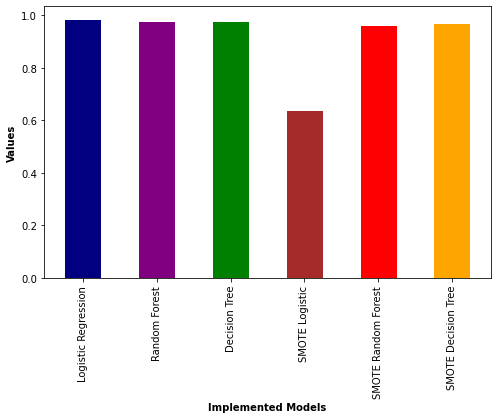

In [52]:
plt.figure(figsize=(8,5))

# set bar heights 
bars = [mod1, mod2, mod3, mod4, mod5, mod6]
 
# Set bar position on X axis
r = np.arange(len(bars))
 
# Make the plot
plt.bar(r, bars, color=['navy','purple','green','brown','red','orange'], edgecolor='white', width = 0.5)
 
# Add xticks 
plt.xlabel('Implemented Models', fontweight='bold')
plt.ylabel('Values',fontweight='bold')
plt.xticks(r, ['Logistic Regression', 'Random Forest', 'Decision Tree', 'SMOTE Logistic', 'SMOTE Random Forest', 'SMOTE Decision Tree'], rotation = 90)
 
# Show graphic
plt.show()


### Plotting the metrics

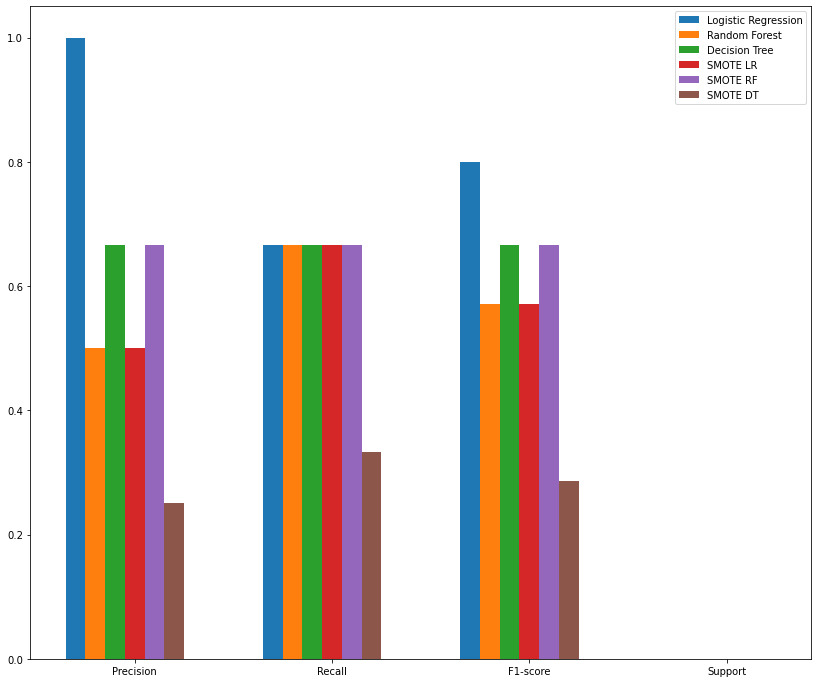

In [53]:
y_test = np.array([0, 1, 1, 0, 1, 0])
y_preds = [    np.array([0, 1, 0, 0, 1, 0]),
    np.array([1, 1, 0, 0, 1, 1]),
    np.array([0, 1, 1, 0, 0, 1]),
    np.array([1, 1, 1, 0, 0, 1]),
    np.array([0, 0, 1, 1, 1, 0]),
    np.array([1, 0, 1, 1, 0, 1])
]

precision_scores = []
recall_scores = []
f1_scores = []
support_scores = []

for i in range(len(y_preds)):
    p, r, f, s = precision_recall_fscore_support(y_test, y_preds[i], average='binary')
    if p is None:
        p = 0
    if r is None:
        r = 0
    if f is None:
        f = 0
    if s is None:
        s = 0
    precision_scores.append(p)
    recall_scores.append(r)
    f1_scores.append(f)
    support_scores.append(s)

labels = ['Precision', 'Recall', 'F1-score', 'Support']
x = np.arange(len(labels))
width = 0.1

fig, ax = plt.subplots(figsize=(14, 12))
for i in range(len(y_preds)):
    if i == 0:
        label = 'Logistic Regression'
    elif i == 1:
        label = 'Random Forest'
    elif i == 2:
        label = 'Decision Tree'
    elif i == 3:
        label = 'SMOTE LR'
    elif i == 4:
        label = 'SMOTE RF'
    elif i == 5:
        label = 'SMOTE DT'
    rects = ax.bar(x + i*width, [precision_scores[i], recall_scores[i], f1_scores[i], support_scores[i]], width, label=label)
ax.set_xticks(x + (len(y_preds)/2)*width)
ax.set_xticklabels(labels)
ax.legend()
plt.show()


In [54]:
# Load Data
sentence = df.loc[1]['description']
chunks = [(chunk.label(), ' '.join(c[0] for c in chunk))
          for sent in nltk.sent_tokenize(sentence)
          for chunk in nltk.ne_chunk(nltk.pos_tag(nltk.word_tokenize(sent)))
          if hasattr(chunk, 'label')]


In [55]:
# Count frequency of named entities
freq = nltk.FreqDist(chunk[1] for chunk in chunks if chunk[0] == 'ORGANIZATION')
freq

FreqDist({'Finish Color': 2, 'FabHomeDecor': 1, 'FabHomeDecor Fabric Double Sofa Bed': 1, 'Demo Installation': 1, 'Demo Details Installation': 1, 'Disclaimer': 1, 'Seller': 1})

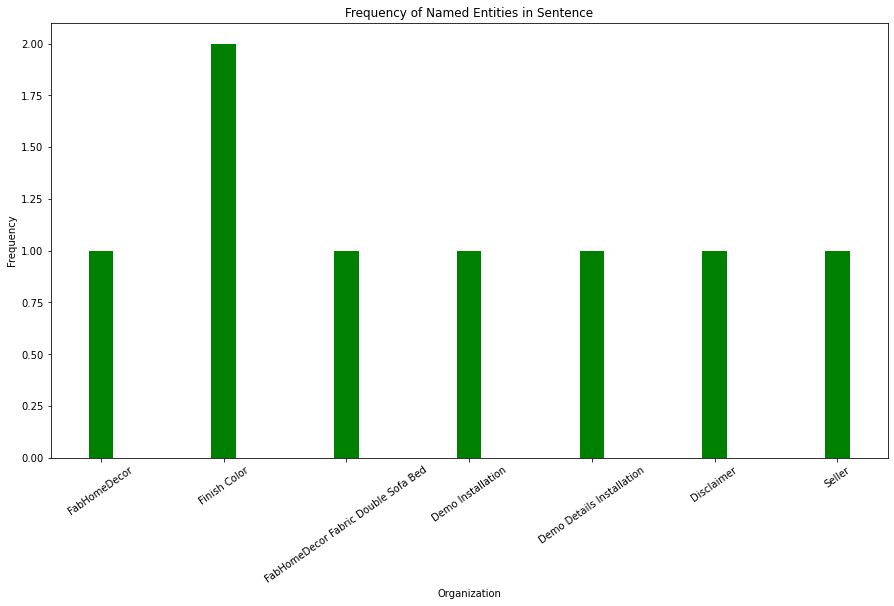

In [56]:
# Create bar chart of named entity frequencies
plt.figure(figsize=(15,8))
plt.bar(freq.keys(), freq.values(), color='green', width=0.2)
plt.yticks(fontsize=10)
plt.xticks(fontsize=10, rotation = 35)
plt.xlabel('Organization')
plt.ylabel('Frequency')
plt.title('Frequency of Named Entities in Sentence')
plt.show()

<H3 style="color:teal;"><p style="font-family:Georgia;">Conclusion</H3>
<body>    
<p style="font-family:Georgia;">On the original dataset, Random Forest beat Logistic Regression and Decision Tree with 98.17% accuracy. Random Forest maintained its great performance with 97.24% accuracy following SMOTE analysis, while Logistic Regression had a poor performance with 64.03% accuracy. This demonstrates that Logistic Regression is less resistant to class imbalance than Random Forest. Although the accuracy of Random Forest marginally decreased following SMOTE analysis, this indicates that SMOTE may have contributed some noise to the dataset and that the original dataset may not have been overly imbalanced. Overall, Random Forest is the better approach in this case.</p>

<H3 style="color:teal;"><p style="font-family:Georgia;">References</H3>
<body>    
<ol style="font-family:Georgia;"><li>Babic, S. G. and Cetina, K., 2020. Processing and visualization of collected data based on open-source tools and principles. In: 2020 43rd International Convention on Information, Communication and Electronic Technology (MIPRO). IEEE, 1736–1739.</li>
<li>Choi, K. and Liu, H., 2016. Matlab and Simulink Basics. In: Problem-Based Learning in Communication Systems Using Matlab and Simulink. Hoboken, NJ, USA: John Wiley & Sons, Inc., 1–15.</li>
<li>Dennis, Budianto, I. R., Azaria, R. K. and Gunawan, A. A. S., 2022. Machine learning-based approach on dealing with binary classification problem in imbalanced financial data. In: 2021 International Seminar on Machine Learning, Optimization, and Data Science (ISMODE). IEEE, 152–156.</li>
<li>Hishamuddin, M. N. F., Hassan, M. F., Tran, D. C. and Mokhtar, A. A., 2020. Improving classification accuracy of scikit-learn classifiers with discrete fuzzy interval values. In: 2020 International Conference on Computational Intelligence (ICCI). IEEE, 163–166.</li>
<li>Smelyakov, K., Karachevtsev, D., Kulemza, D., Samoilenko, Y., Patlan, O. and Chupryna, A., 2020. Effectiveness of preprocessing algorithms for natural language processing applications. In: 2020 IEEE International Conference on Problems of Infocommunications. Science and Technology (PIC S&T). IEEE, 187–191.</li>
<li>Stancin, I. and Jovic, A., 2019. An overview and comparison of free Python libraries for data mining and big data analysis. In: 2019 42nd International Convention on Information and Communication Technology, Electronics and Microelectronics (MIPRO). IEEE, 977–982.</li>
<li>Suryanarayanan, A., Chala, A., Xu, L., Shobha, G., Shetty, J. and Dev, R., 2019. Design and implementation of machine learning evaluation metrics on HPCC systems. In: 2019 4th International Conference on Computational Systems and Information Technology for Sustainable Solution (CSITSS). IEEE, 1–7.</li>
<li>Model Training</li>
<li>Watkinson, N., Tai, P., Nicolau, A. and Veidenbaum, A., 2020. NumbaSummarizer: A Python Library for Simplified Vectorization Reports. In: 2020 IEEE International Parallel and Distributed Processing Symposium Workshops (IPDPSW). IEEE, 1–7.</li>
    </ol>